## Setup

In [1]:
from IPython.display import clear_output

In [2]:
# !conda install --yes gdown
!pip install tensorflow-gan
clear_output()

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [4]:
import tensorflow as tf
import tensorflow_gan as tfgan
from tensorflow.keras.layers import Input,Conv2D,Concatenate,UpSampling2D,Dropout,Conv2DTranspose
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
 
from scipy.linalg import sqrtm
import random
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))
model_IS = InceptionV3()
 
 
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'
clear_output()

In [5]:
class SNConv2D(tf.keras.layers.Conv2D):
 
    def build(self, input_shape):        
        
        self.input_dim = input_shape[-1]
        
        kernel_shape = self.kernel_size + (self.input_dim, self.filters)
        self.kernel = self.add_weight(shape=kernel_shape,
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)
                                      
        if self.use_bias:
            self.bias = self.add_weight(shape=(self.filters,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
        self.u = tf.random.truncated_normal(mean=0,stddev=1,shape=(1,self.filters))
        self.built = True
 
    def call(self, inputs, Training=None):
        w_shape = list(self.kernel.get_shape())
        w_ = tf.reshape(self.kernel,[-1,w_shape[-1]])
        def L2_norm(vector,eps=1e-5):
            v_norm = tf.sqrt(tf.reduce_sum(tf.square(vector))) + eps
            return tf.multiply(vector,1/v_norm)
            
        def power_iteration(w,u):
            v_bar = L2_norm(tf.matmul(u,tf.transpose(w)))
            u_bar = L2_norm(tf.matmul(v_bar,w))
            return u_bar,v_bar        
        u_bar,v_bar = power_iteration(w_,self.u)
        sigma = tf.matmul(tf.matmul(v_bar,w_),tf.transpose(u_bar))
        w_bar = tf.reshape(w_ / sigma,w_shape)
        if Training:
            self.u = u_bar
            
        
        img_output = tf.nn.conv2d(
            inputs, w_bar, 
            strides=self.strides,
            padding=self.padding.upper(),
            dilations=self.dilation_rate)
        if self.use_bias:
            img_output = tf.nn.bias_add(
                img_output,
                self.bias)
        if self.activation is not None:
            img_output = self.activation(img_output)
            
        return img_output
 
 
class Self_Attention(tf.keras.Model):
    def __init__(self,input_dim):
        super(Self_Attention,self).__init__()
        self.l1 = SNConv2D(kernel_size=1,filters=input_dim//8,name='Q',kernel_initializer='glorot_normal')
        self.l2 = SNConv2D(kernel_size=1,filters=input_dim//8,name='Q1',kernel_initializer='glorot_normal')
        self.l3 = SNConv2D(kernel_size=1,filters=input_dim//2,name='Q2',kernel_initializer='glorot_normal')
        self.sigma = tf.Variable(0.0,trainable=True)
    def call(self,inputs):
        _, H, W, C = inputs.shape
        # print(inputs.shape)
        batch_size = 1
        HW = H*W
                
        theta = self.l1(inputs)
        theta = tf.reshape(theta,(batch_size,HW,-1))#bhw(c//8)
        # print(theta.shape)
        f2 = self.l2(inputs)
        # print(f2.shape)
        f2 = tf.keras.layers.MaxPool2D(strides=(2,2))(f2)
        phi = tf.transpose(tf.reshape(f2,(batch_size,HW//4,C//8)),(0,2,1))#b(c//8)hw//4
        
        attn = tf.nn.softmax(tf.matmul(theta,phi))#bhwhw//4
        
        
        f3 = self.l3(inputs)
        f3 = tf.keras.layers.MaxPool2D(strides=(2,2))(f3)
        g = tf.reshape(f3,(batch_size,HW//4,C//2))#bhw//4(c//2)
        
        attn_g = tf.reshape(tf.matmul(attn,g),(batch_size,H,W,C//2))#bhwc//2
        
        out = tf.keras.layers.Conv2D(kernel_size=1,filters=C)(attn_g)#bhwc
        z = self.sigma*out + inputs
        return z
    
    
def reflect_pad(x,p):
  padding = tf.constant([[0,0],[p,p],[p,p],[0,0]])
  return tf.pad(x,padding,mode='REFLECT')
 
def Conv_Block(x,f,k=7,s=1,act=tf.nn.leaky_relu):
  #ReflectivePadding-Conv-InstanceNorm-Relu
  a = reflect_pad(x,(k-1)//2)
  a = SNConv2D(f,k,strides=s,kernel_initializer='glorot_normal')(a)
  a = tf.keras.layers.BatchNormalization()(a)
  a = act(a)
  return a
 
def Res_Block(x,f,k=3,s=1):
  a1 = Conv_Block(x,f,k,s)
  a2 = Conv_Block(a1,f,k,s)
  a = x + a2
  return a
 
 
 
def calc_FID(imgs1,imgs2):
    
    imgs1 = tf.image.resize(imgs1,[299,299])
    imgs2 = tf.image.resize(imgs2,[299,299])
    imgs1 = preprocess_input(imgs1)
    imgs2 = preprocess_input(imgs2)
    
    p0 = model.predict_on_batch(imgs1)
    p1 = model.predict_on_batch(imgs2)
    # p0 = np.uint8(tf.multiply(p0,100))
    # p1 = np.uint8(tf.multiply(p1,100))
    # a = np.mean(np.square(p0 - p1))
    # c1, c2 = np.cov(p0,rowvar=0), np.cov(p1,rowvar=0)
    # b = np.trace(c1 + c2 -2 * np.real(sqrtm(np.dot(c1,c2))))
    # FID = a + b
    ############### a little faster than manual implementaiton
    FID = tfgan.eval.frechet_classifier_distance_from_activations(p0, p1)
    return FID
 
def calc_IS(imgs1,n_split=5):
    
    imgs1 = tf.image.resize(imgs1,[299,299])
    imgs1 = preprocess_input(imgs1)
    
    p0 = model_IS.predict_on_batch(imgs1)
    b = tf.convert_to_tensor(tf.split(p0,5),dtype=tf.float64)
    c = tf.reduce_mean(b,1,keepdims=True)
    d = b * (tf.math.log(b+1e-16)-tf.math.log(c+1e-16))
    Scores = tf.math.exp(tf.reduce_mean(tf.reduce_sum(d,2,keepdims=1),1))
    return (tf.reduce_mean(Scores))

In [6]:
def show_images(images,depro=False):
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))
    if depro:
      images = deprocess_img(images)
      sqrtn = 10
    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)
    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img)
    return
 
def minimal_show(x):
  x = deprocess_img(x)
  plt.figure(figsize=(14,14))
  plt.subplot(141)
  plt.axis('off')
  plt.title('win')
  plt.imshow(x[0])
  plt.subplot(142)
  plt.title('->sum')
  plt.axis('off')
  plt.imshow(x[1])
  plt.subplot(143)
  plt.axis('off')
  plt.title('sum')
  plt.imshow(x[2])
  plt.subplot(144)
  plt.axis('off')
  plt.title('->win')
  plt.imshow(x[3])
  
  plt.show()
 
 
def deprocess_img(x):
    x = (x + 1.0) / 2.0
    return np.uint8(x * 255)

## Dataset


In [7]:
sum_yos = np.load('/content/drive/My Drive/selected_sum_yos.npy')
win_yos = np.load('/content/drive/My Drive/selected_win_yos.npy')
 
 
sy = np.expand_dims((np.float32(sum_yos[:1000])/127.5)-1,1)
wy = np.expand_dims((np.float32(win_yos[:1000])/127.5)-1,1)
print(sy.shape)
 
del sum_yos
del win_yos

(1000, 1, 256, 256, 3)


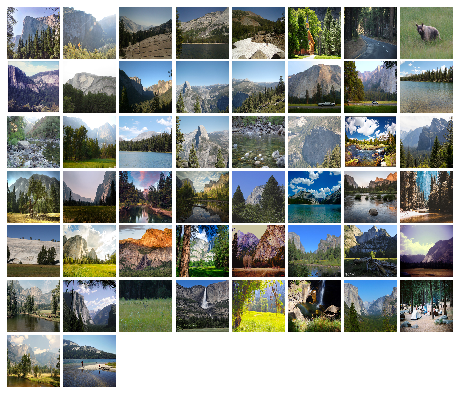

In [8]:
show_images(np.squeeze(deprocess_img(sy[:50])))

## Generator


In [9]:
def R_generator():
  f = 64
  I = Input((256,256,3))
  a = Conv_Block(I,f)
  a = Conv_Block(a,2*f,k=3,s=2)
  for i in range(9):
    a = Res_Block(a,2*f)
 
  a = Conv_Block(a,4*f,k=3,s=1)
  a = tf.nn.depth_to_space(a,2)
  a = Conv_Block(a,3,act=tf.nn.tanh)
  return Model(inputs=I, outputs=a)

## Discriminator


In [10]:
def discriminator():
  f = 64
  act = tf.nn.leaky_relu
  def block(a,f,k=4,Normalization=True):
    a = SNConv2D(f,k,strides=2,padding='SAME')(a)
    if Normalization:
      a = tf.keras.layers.BatchNormalization()(a)
    a = tf.nn.leaky_relu(a) 
    return a
  il = Input(shape=(256,256,3))
  b = block(il,1*f,Normalization=0)
  b = block(b,2*f,Normalization=1)
  # b = Self_Attention(2*f)(b)
  b = block(b,4*f,Normalization=1)
  b = block(b,8*f,Normalization=1)
  out = Conv2D(1,kernel_size=4,padding='SAME')(b)
  model = Model(inputs=il,outputs=out)
  return model

In [11]:
def discriminator_loss(logits_real, logits_fake):
  #hinge loss
  l1 = tf.reduce_mean(tf.nn.relu(1-logits_real))
  l2 = tf.reduce_mean(tf.nn.relu(1+logits_fake))
  loss = l1+l2
  
  # fake = tf.zeros_like(logits_fake)
  # l1 = tf.reduce_mean(tf.square(tf.ones_like(logits_real)-logits_real))
  # l2 = tf.reduce_mean(tf.square(tf.ones_like(logits_fake)-logits_fake))
  # loss = .5 * (l1+l2)
  return loss
 
def generator_loss(logits_fake,x_real,target_domain_recons,identity_recons,landa,landa2):
  adv_loss = -tf.reduce_mean(logits_fake)
  
  # adv_loss = tf.reduce_mean(tf.square(tf.ones_like(logits_fake)-logits_fake))
  
  r1 = tf.reduce_mean(tf.abs(x_real-target_domain_recons))
  r2 = tf.reduce_mean(tf.abs(x_real-identity_recons))
  loss = adv_loss + landa*r1 + landa2 *r2
  return loss

In [12]:
D1 = discriminator()
D2 = discriminator()
 
G1 = R_generator()
G2 = R_generator()
 
D_solver = Adam(learning_rate=2e-4,beta_1=0)
G_solver = Adam(learning_rate=1e-4,beta_1=0)

In [13]:
FIDs = []
ISs = []
G_Errors = []
D_Errors = []
PICS = []

In [14]:
G1.load_weights('/content/drive/My Drive/G1_V2/')
G2.load_weights('/content/drive/My Drive/G2_V2/')
D1.load_weights('/content/drive/My Drive/D1_V2/')
D2.load_weights('/content/drive/My Drive/D2_V2/')
FIDs = np.load('/content/drive/My Drive/FIDs_V2.npy',FIDs).tolist()
ISs = np.load('/content/drive/My Drive/ISs_V2.npy',ISs).tolist()
G_Errors = np.load('/content/drive/My Drive/GEs_V2.npy',G_Errors).tolist()
D_Errors = np.load('/content/drive/My Drive/DEs_V2.npy',D_Errors).tolist()
             

In [16]:
def train(D1,D2, G1,G2, D_solver, G_solver, discriminator_loss, generator_loss,\
              save_every=80,batch_size=128, num_epochs=10,lr_decay=0):
    
    Buff_D1 = np.zeros((50,256,256,3),dtype=np.float32)
    Buff_D2 = np.zeros_like(Buff_D1)
    R_BUFF = np.zeros_like(Buff_D1)
    R2_BUFF = np.zeros_like(Buff_D1)
    
    landa = 7 #cycle consistency coeff.
    landa2 = .1 * 10 #identitiy reconstruction coeff.
    idxs1 = np.arange(1000)
    idxs2 = np.arange(1000)
    
    for epoch in range(num_epochs):
        
        random.shuffle(idxs1)
        random.shuffle(idxs2)
            
        for i in range(1000):
            xs,xw = sy[idxs1[i]],wy[idxs2[i]]
            R_BUFF[i%50] = xs
            R2_BUFF[i%50] = xw
            
            with tf.GradientTape() as tape:
              
                fake_xw = G1(xs)
                l1_fake = D1(fake_xw)
                Buff_D1[i%50] = fake_xw
                l1_real = D1(xw)
                
                fake_xs = G2(xw)
                l2_fake = D2(fake_xs)
                Buff_D2[i%50] = fake_xs
                l2_real = D2(xs)
              
                D1_total_error = discriminator_loss(l1_real, l1_fake)
                D2_total_error = discriminator_loss(l2_real, l2_fake)
                d_total_error = D1_total_error + D2_total_error
            
            d_gradients = tape.gradient(d_total_error, D1.trainable_variables+D2.trainable_variables)      
            D_solver.apply_gradients(zip(d_gradients, D1.trainable_variables+D2.trainable_variables))
            D_Errors.append(d_total_error)
            
            with tf.GradientTape() as tape:
                f_fake_xw = G1(fake_xs)
                f2_fake_xw = G1(xw)
                
                f_fake_xs = G2(fake_xw)
                f2_fake_xs = G2(xs)
                
                g1_loss = generator_loss(l1_fake,xw,f_fake_xw,f2_fake_xw,landa,landa2)
                g2_loss = generator_loss(l2_fake,xs,f_fake_xs,f2_fake_xs,landa,landa2)
 
                g_total_error = g1_loss + g2_loss
 
            g_gradients = tape.gradient(g_total_error, G1.trainable_variables+G2.trainable_variables)      
            G_solver.apply_gradients(zip(g_gradients, G1.trainable_variables+G2.trainable_variables))
            G_Errors.append(g_total_error)
            
            if not i % 50:
                ISs.append(0.5 * (calc_IS(Buff_D1) + calc_IS(Buff_D2)))
 
                
            
            if (i % save_every == 0):
                FIDs.append((calc_FID(R2_BUFF,Buff_D1) + calc_FID(R_BUFF,Buff_D2))*.5)
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}, IS:{:.4}, FID:{:.4}'.format(epoch, i,d_total_error,g_total_error,ISs[-1],FIDs[-1]))
                G1.save_weights('/content/drive/My Drive/G1_V2/')
                G2.save_weights('/content/drive/My Drive/G2_V2/')
                D1.save_weights('/content/drive/My Drive/D1_V2/')
                D2.save_weights('/content/drive/My Drive/D2_V2/')
 
                xs_numpy = fake_xs.cpu().numpy()
                xw_numpy = fake_xw.cpu().numpy()
                minimal_show(np.concatenate((xw,xs_numpy,xs,xw_numpy)))
                
                np.save('/content/drive/My Drive/FIDs_V2.npy',FIDs)
                np.save('/content/drive/My Drive/ISs_V2.npy',ISs)
                np.save('/content/drive/My Drive/GEs_V2.npy',G_Errors)
                np.save('/content/drive/My Drive/DEs_V2.npy',D_Errors)
#                 PICS.append(np.concatenate((xw,xs_numpy,xs,xw_numpy)))
                del xw_numpy
                del xs_numpy

Epoch: 0, Iter: 0, D: 4.024, G:7.857, IS:1.0, FID:0.4184


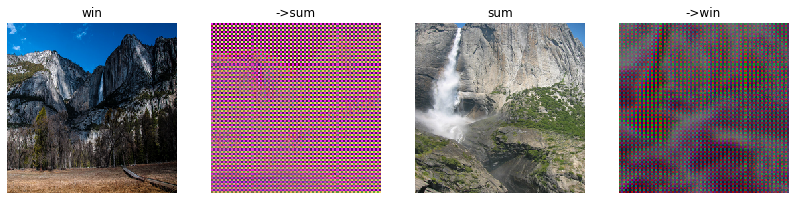

Epoch: 0, Iter: 250, D: 3.357, G:3.251, IS:1.026, FID:13.97


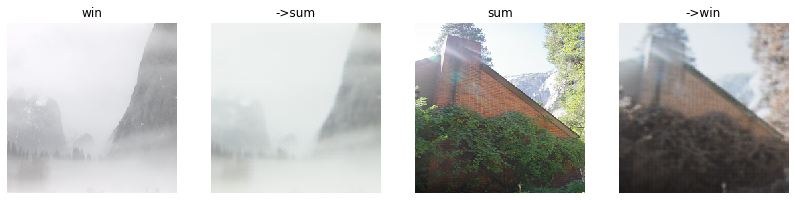

Epoch: 0, Iter: 500, D: 1.345, G:4.195, IS:1.036, FID:11.59


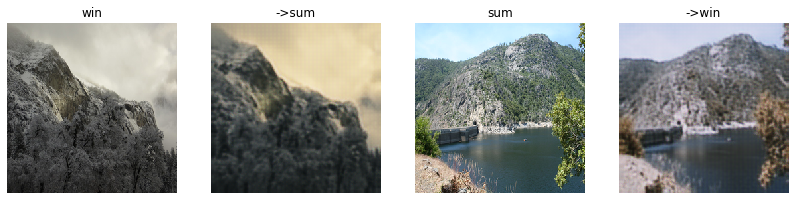

Epoch: 0, Iter: 750, D: 2.372, G:4.256, IS:1.043, FID:10.5


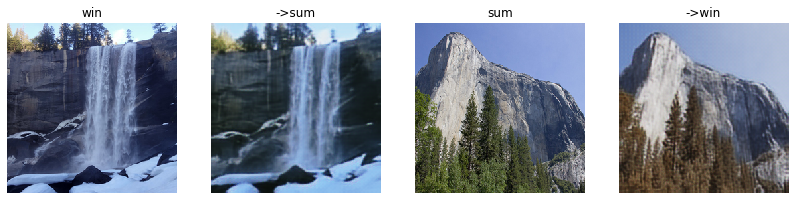

Epoch: 1, Iter: 0, D: 1.351, G:3.961, IS:1.079, FID:16.16


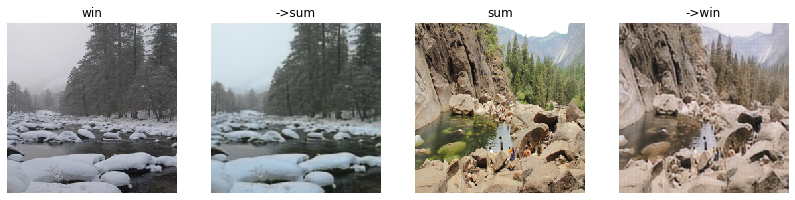

In [ ]:
train(D1, D2, G1, G2, D_solver, G_solver, discriminator_loss, generator_loss,batch_size=1,save_every=250,num_epochs=25)

Epoch: 0, Iter: 0, D: 4.198, G:2.835, IS:1.004, FID:0.7547
Instructions for updating:
Use tf.identity instead.


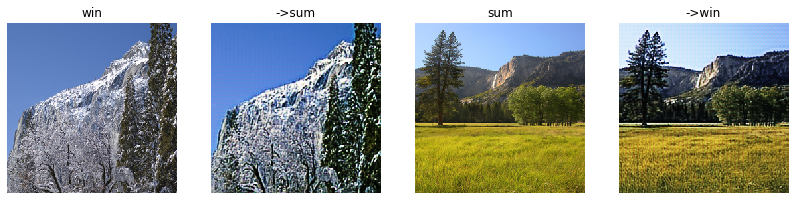

Epoch: 0, Iter: 250, D: 3.511, G:1.649, IS:1.064, FID:10.32


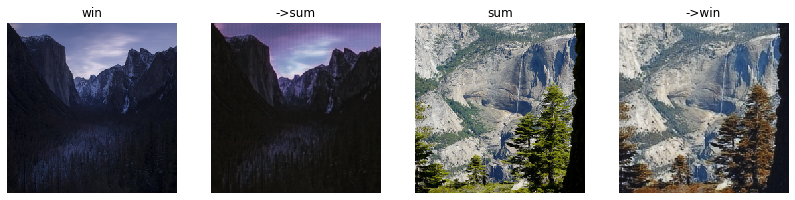

Epoch: 0, Iter: 500, D: 0.9575, G:4.669, IS:1.066, FID:10.05


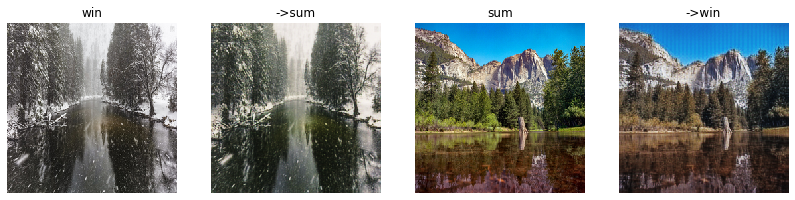

Epoch: 0, Iter: 750, D: 0.9995, G:2.659, IS:1.06, FID:7.59


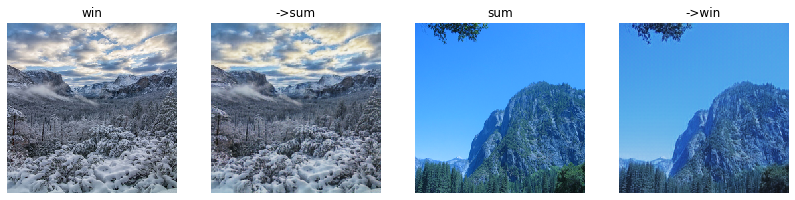

Epoch: 1, Iter: 0, D: 0.9566, G:3.883, IS:1.071, FID:9.37


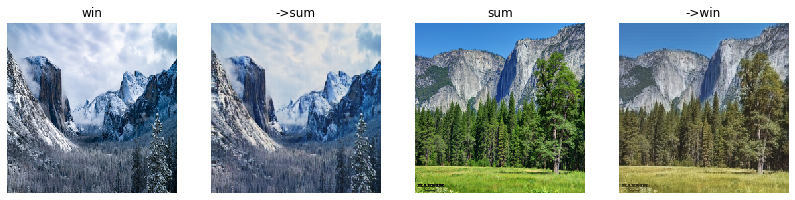

Epoch: 1, Iter: 250, D: 1.576, G:2.959, IS:1.064, FID:12.22


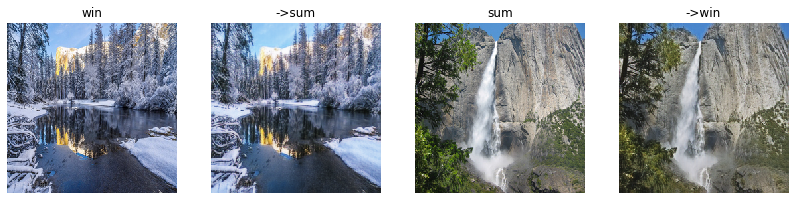

Epoch: 1, Iter: 500, D: 0.9965, G:6.79, IS:1.051, FID:12.19


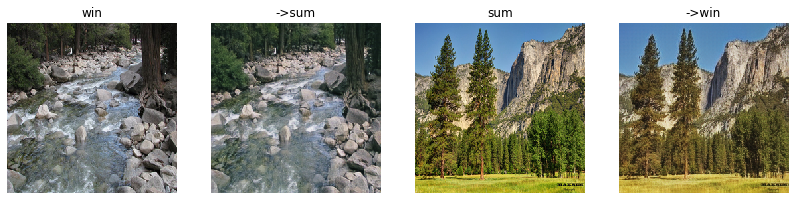

Epoch: 1, Iter: 750, D: 3.813, G:2.766, IS:1.069, FID:10.09


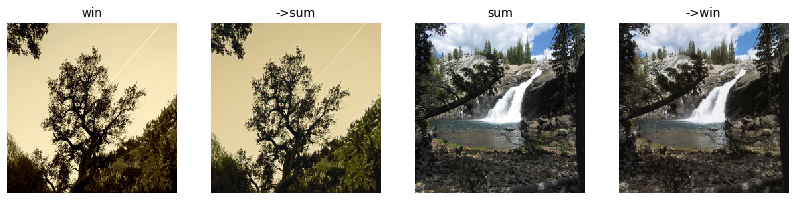

Epoch: 2, Iter: 0, D: 1.943, G:2.283, IS:1.036, FID:8.423


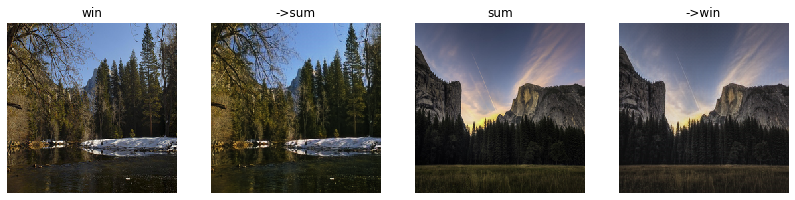

Epoch: 2, Iter: 250, D: 1.309, G:5.744, IS:1.06, FID:9.654


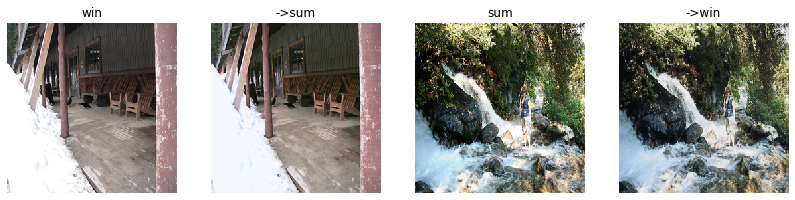

Epoch: 2, Iter: 500, D: 2.414, G:2.824, IS:1.053, FID:10.84


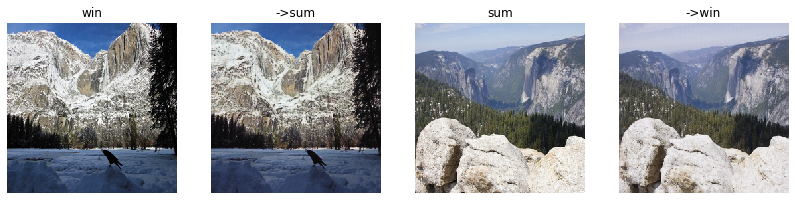

Epoch: 2, Iter: 750, D: 3.633, G:2.662, IS:1.05, FID:8.794


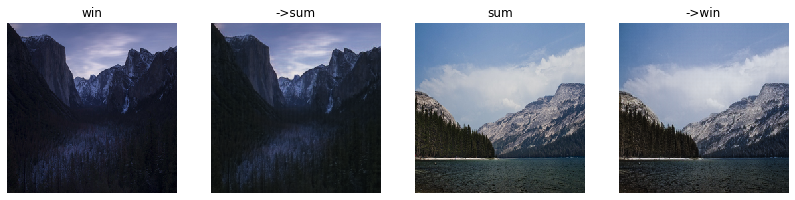

Epoch: 3, Iter: 0, D: 2.693, G:1.698, IS:1.081, FID:10.07


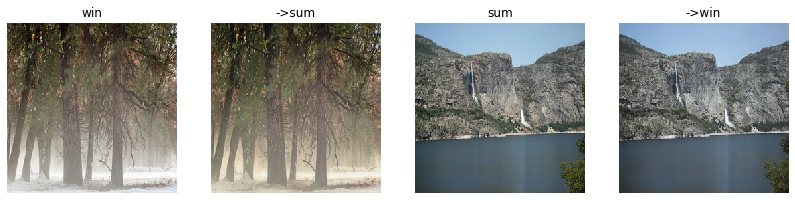

Epoch: 3, Iter: 250, D: 1.672, G:3.663, IS:1.055, FID:10.41


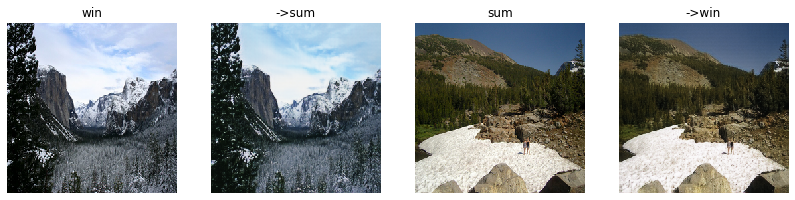

Epoch: 3, Iter: 500, D: 1.926, G:2.089, IS:1.057, FID:8.43


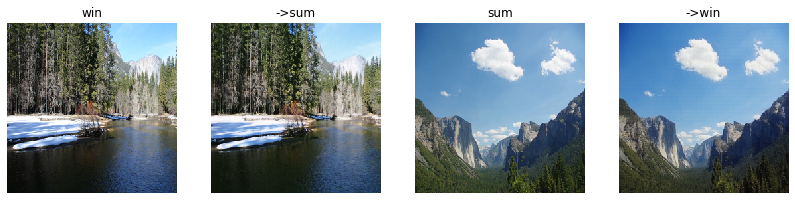

Epoch: 3, Iter: 750, D: 3.917, G:1.488, IS:1.039, FID:8.335


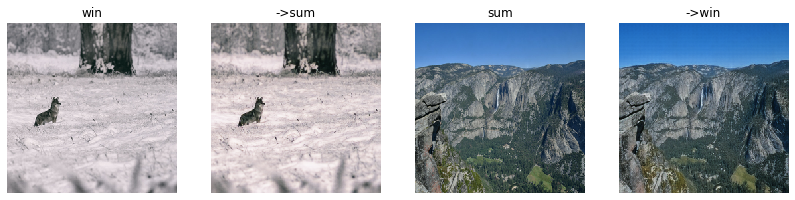

Epoch: 4, Iter: 0, D: 1.546, G:3.002, IS:1.054, FID:10.18


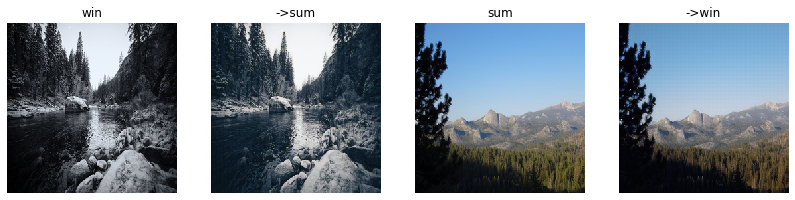

Epoch: 4, Iter: 250, D: 1.657, G:2.9, IS:1.05, FID:9.445


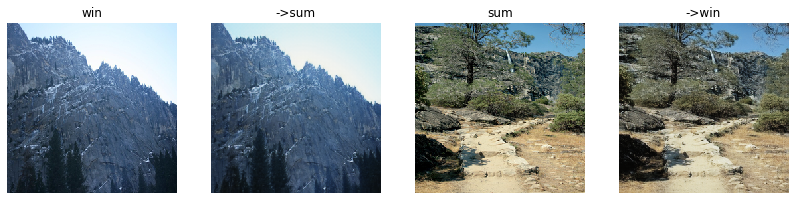

Epoch: 4, Iter: 500, D: 1.505, G:2.308, IS:1.049, FID:8.338


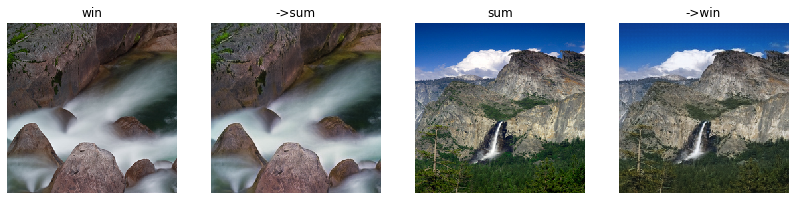

Epoch: 4, Iter: 750, D: 2.061, G:2.55, IS:1.063, FID:10.9


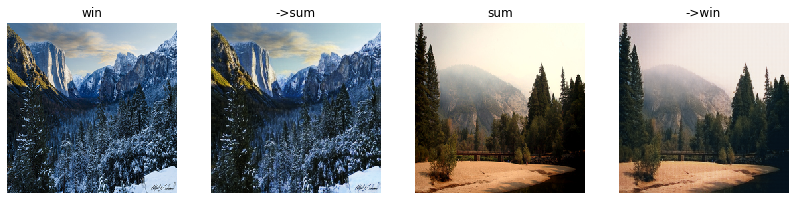

Epoch: 5, Iter: 0, D: 1.749, G:3.653, IS:1.04, FID:7.979


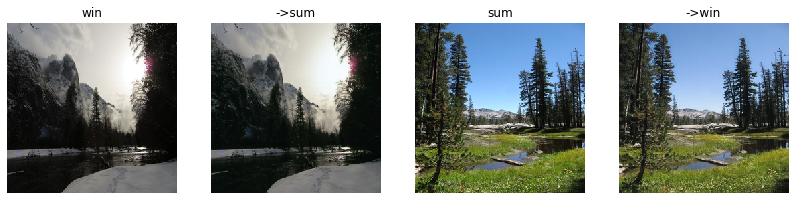

Epoch: 5, Iter: 250, D: 1.322, G:2.826, IS:1.036, FID:7.781


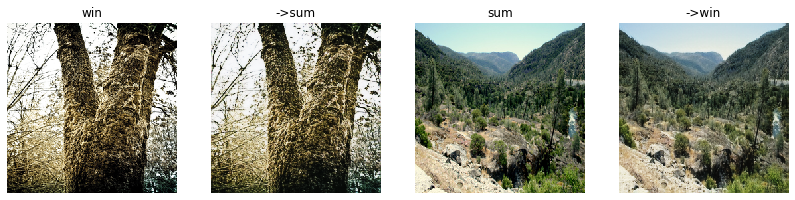

Epoch: 5, Iter: 500, D: 2.307, G:2.466, IS:1.093, FID:9.413


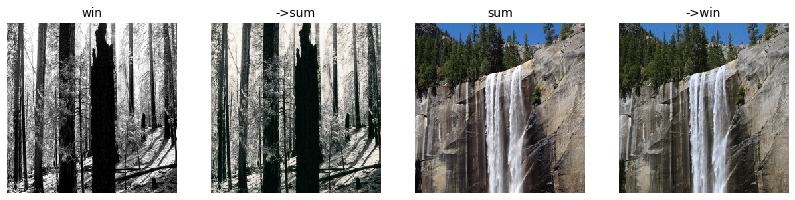

Epoch: 5, Iter: 750, D: 3.523, G:0.8747, IS:1.05, FID:9.928


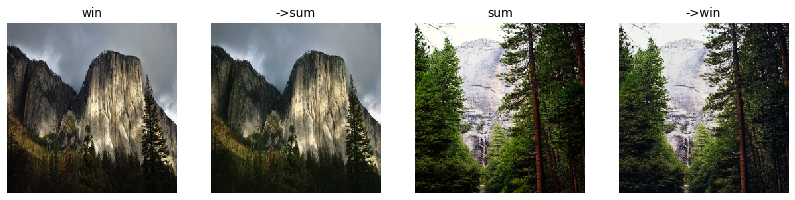

In [ ]:
train(D1, D2, G1, G2, D_solver, G_solver, discriminator_loss, generator_loss,batch_size=1,save_every=250,num_epochs=10)